# Phoenix 
[flash count](#flash-count) | [diurnal cycle](#diurnal-cycle) | [peak time](#peak-time) | [amplitude of DC](#amplitude-of-DC) | [TOP100](#top-100) | [interesting event](#interesting-event)

In [1]:
from __init__ import *
from plotting import *
from region import Region

%matplotlib inline

In [22]:
c = Region(city=cities['phoenix'])
c.define_grid(nbins=600)

## flash count

In [ ]:
MMDC_grid = {}
MMFC_grid = {}
for m in range(1,13):
    print m
    ds = c.get_ds(m=m, grid=True)
    c.to_DC_grid(ds)
    ds.close()
    MMDC_grid.update({m: c.DC_grid})
    MMFC_grid.update({m: c.FC_grid})

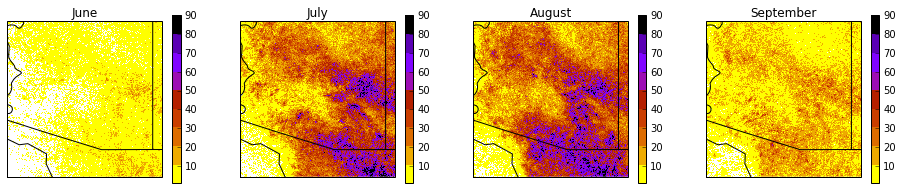

In [29]:
plt.figure(figsize=(16, 3))
n=1
for m in [6,7,8,9]:
    ax = background(plt.subplot(1, 4, n, projection=ccrs.PlateCarree()))
    c.plot_grid(MMFC_grid[m], vmin=1, vmax=90, cbar=True, ax=ax)
    ax.set_title(months[m])
    n+=1

## diurnal cycle
[Top](#Python-programs)

For now this is all based around hour of the day. This is much simpler than trying to divide the day into 15min intervals. But if we decide that we really need that capability, then we can work on it.

In [11]:
h = range(12,24)
h.extend(range(0,13))

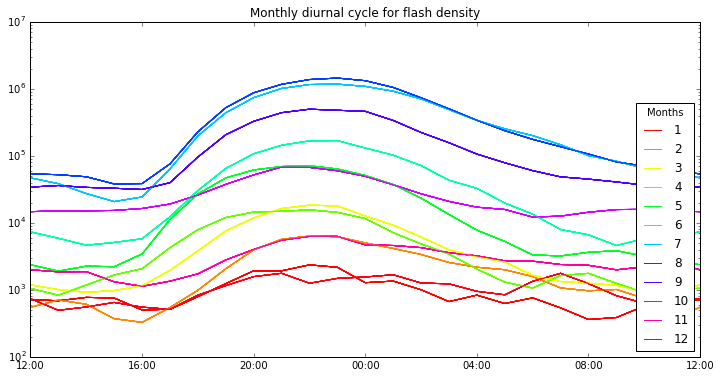

In [37]:
import matplotlib.cm as cm
h = range(12,24)
h.extend(range(0,13))

MMDC = pd.DataFrame(np.array([[np.sum(MMDC_grid[m][hr]) for hr in h] for m in months.keys()]).T)
MMDC.columns = range(1,13)

plt.figure(figsize=(12, 6))
for m in months.keys():
    ax = plt.subplot(1,1,1)
    MMDC.plot(color=cm.hsv(np.linspace(0, 1, 12)), ax=ax, title='Monthly diurnal cycle for flash density')
    plt.legend(range(1,13), title='Months', loc='lower right')
    ax.set_xticks(range(0,25,4))
    ax.set_xticklabels(['{num:02d}:00'.format(num=h[n]) for n in range(0,25,4)])
    ax.set_ylim(10**2, 10**7)
    ax.semilogy()
    ax.set_xlim(0,24)

## peak time
[Top](#Python-programs)
 - JJA CG flash density (Hour time resolution); ~ 10 km grid


In [36]:
JADC_grid = {}
for k,v in MMDC_grid[7].items():
    JADC_grid.update({k: v + MMDC_grid[8][k]})

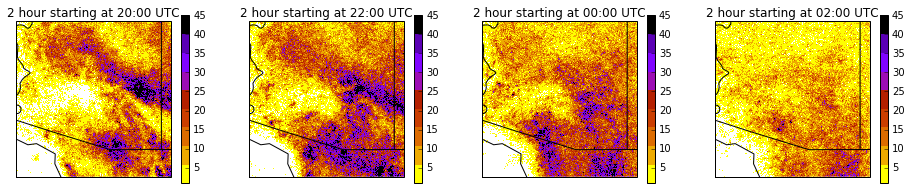

In [42]:
plt.figure(figsize=(16,3))
n=1
step = 2
for i in range(8,16,step):
    q=np.zeros(JADC_grid[0].shape)
    for hr in h[i:i+step]:
        q+=JADC_grid[hr]
    ax = background(plt.subplot(1, 4, n, projection=ccrs.PlateCarree()))
    ax.set_title('{step} hour starting at {t:02d}:00 UTC'.format(step=step, t=h[i]))
    c.plot_grid(q,vmin=1, vmax=45, cbar=True, ax=ax)
    n+=1

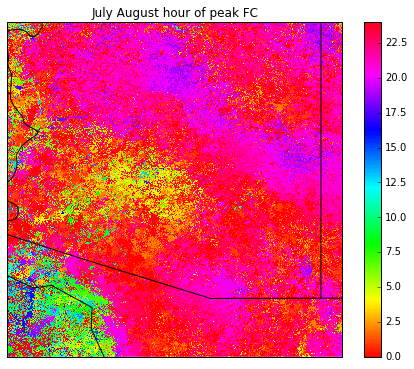

In [45]:
plt.figure(figsize=(8,6))

a = np.argmax(np.stack(JADC_grid.values()), axis=0)
im, ax = c.plot_grid(a, cmap='hsv', vmin=0, vmax=24, cbar=True)
ax.set_title('July August hour of peak FC');

## amplitude of DC
[Top](#Python-programs)
 - “Amplitude” of the diurnal cycle; 1 hour time resolution ~1km grid.  CG flash density at the time of maximum flash density - CG flash density a time of minimum flash density divided by the mean flash density. 

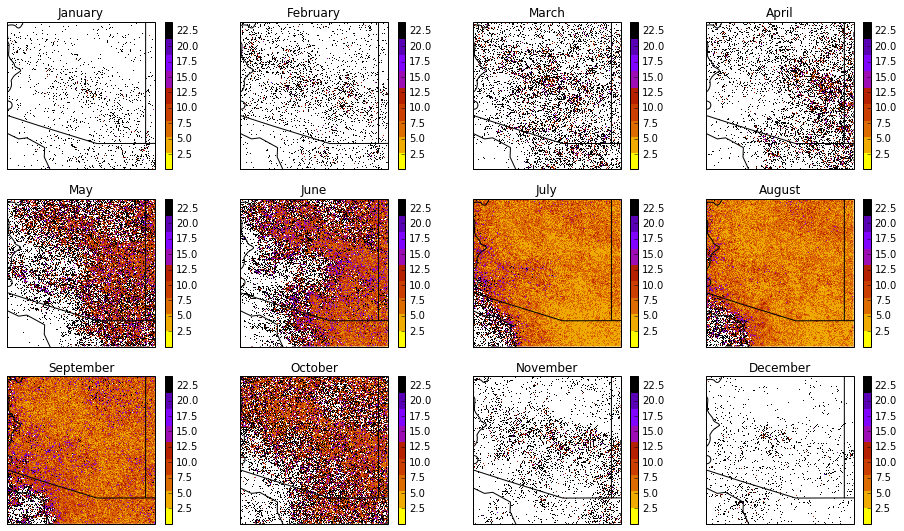

In [63]:
plt.figure(figsize=(16, 9))
for m in months.keys():
    ax = background(plt.subplot(3, 4, m, projection=ccrs.PlateCarree()))
    hourly3D = np.stack(MMDC_grid[m].values())
    amplitude = ((np.max(hourly3D, axis=0)-np.min(hourly3D, axis=0))/np.mean(hourly3D, axis=0))
    amplitude = np.nan_to_num(amplitude)
    c.plot_grid(amplitude, cbar=True, vmin=.0001, ax=ax)
    ax.set_title(months[m])

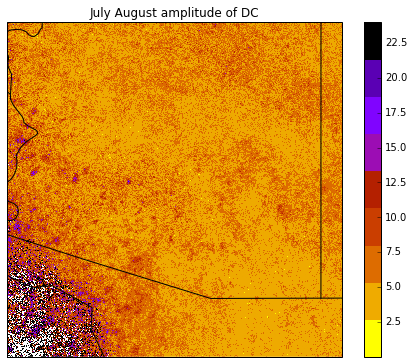

In [66]:
plt.figure(figsize=(8,6))
hourly3D = np.stack(np.stack(JADC_grid.values()))
amplitude = ((np.max(hourly3D, axis=0)-np.min(hourly3D, axis=0))/np.mean(hourly3D, axis=0))
amplitude = np.nan_to_num(amplitude)
im, ax = c.plot_grid(amplitude, cbar=True, vmin=.0001)
ax.set_title('July August amplitude of DC');

## top 100
[Top](#Python-programs)

This function is kind of dirty because it uses filesize as a first pass proxy for FC. 

In [67]:
top100 = c.get_top(100)
top100

2014-07-08 12:00:00    145709
2014-07-26 12:00:00    122729
2014-07-25 12:00:00    120618
2014-09-27 12:00:00    117058
2015-08-31 12:00:00    105243
2015-06-30 12:00:00     98852
2015-08-07 12:00:00     98817
2014-09-26 12:00:00     98620
2015-08-11 12:00:00     98493
2015-08-27 12:00:00     94789
2015-08-30 12:00:00     87791
2014-07-13 12:00:00     85789
2015-08-25 12:00:00     85031
2015-08-29 12:00:00     80821
2014-07-27 12:00:00     80373
2014-08-17 12:00:00     79893
2015-07-18 12:00:00     79348
2015-08-26 12:00:00     75447
2012-08-21 12:00:00     75395
2015-08-22 12:00:00     75148
2015-08-23 12:00:00     73823
2013-08-22 12:00:00     72258
2014-08-12 12:00:00     71938
2015-07-01 12:00:00     71743
2013-09-06 12:00:00     70328
2014-07-07 12:00:00     66744
2014-09-04 12:00:00     65345
2013-08-26 12:00:00     64237
2014-08-26 12:00:00     63481
2015-07-31 12:00:00     62023
                        ...  
2015-08-06 12:00:00     45336
2012-07-29 12:00:00     45090
2013-07-25

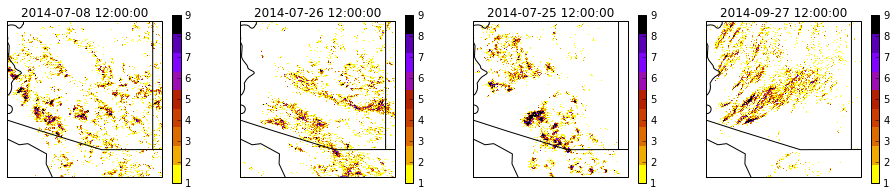

In [71]:
plt.figure(figsize=(16, 3))
for n in range(1,5):    
    ax = background(plt.subplot(1, 4, n, projection=ccrs.PlateCarree()))
    ds0 = c.get_daily_ds(top100.index[n-1],func='grid')
    ds0.close()
    c.plot_grid(c.FC_grid, vmin=1, vmax=9, cbar=True, ax=ax)
    ax.set_title(top100.index[n-1])

## interesting event

In [75]:
c.define_grid(60)
box, tr = c.get_grid_slices('2007-07-31', freq='5min', filter=False)

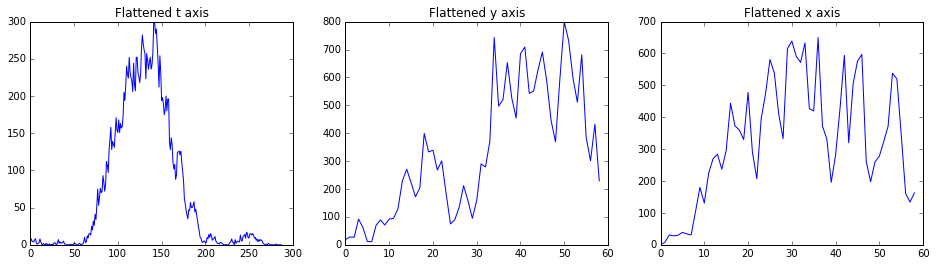

In [76]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16,4))

axes[0].plot(np.sum(box, axis=(1,2)))
axes[0].set_title("Flattened t axis");

axes[1].plot(np.sum(box, axis=(0,2)))
axes[1].set_title("Flattened y axis")

axes[2].plot(np.sum(box, axis=(0,1)))
axes[2].set_title("Flattened x axis");

In [112]:
#c.define_grid(nbins=200, extents=[c.gridx[25], c.gridx[45], c.gridy[35], c.gridy[55]])
c.define_grid(nbins=600)
box, tr = c.get_grid_slices('2007-07-31', freq='5min', filter=False)
box = box[60:200,:,:]
tr = tr[60:200]

In [113]:
from scipy import ndimage
gauss2d = np.array([ndimage.filters.gaussian_filter(box[i,:,:], 3) for i in range(box.shape[0])])


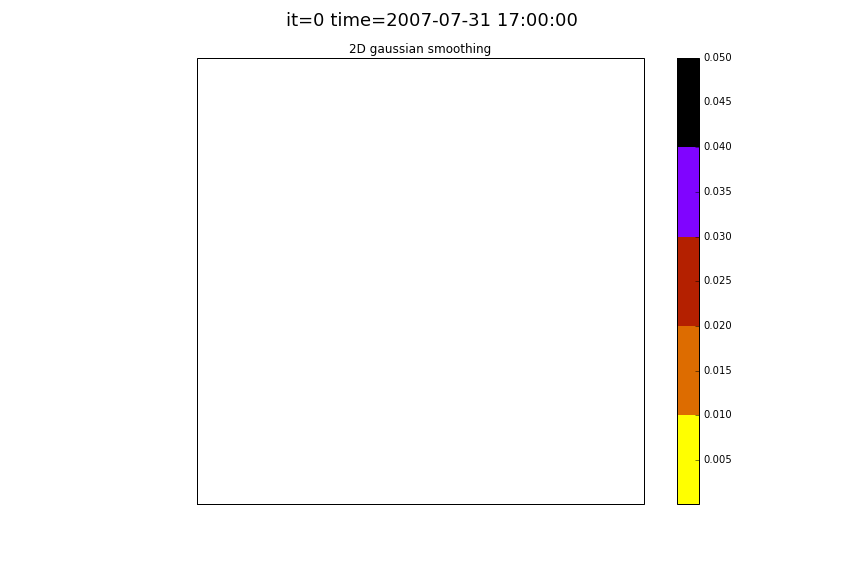
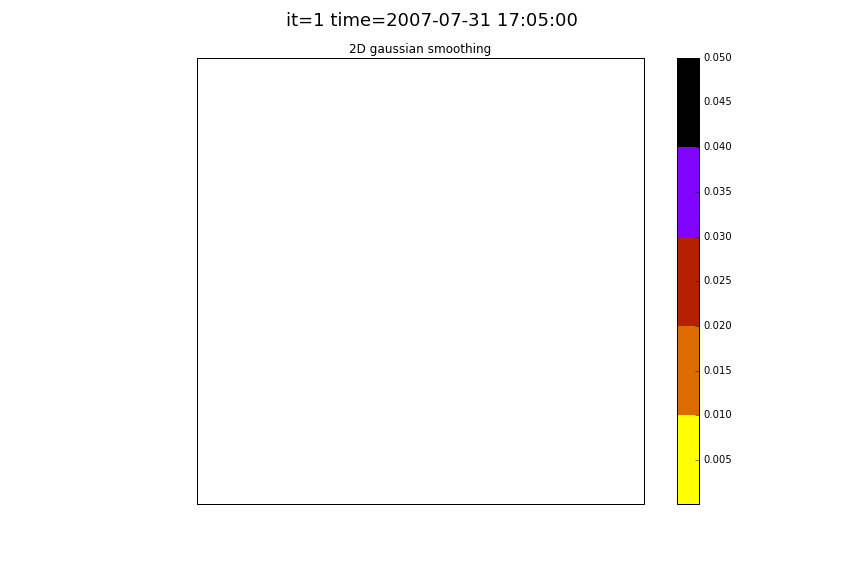
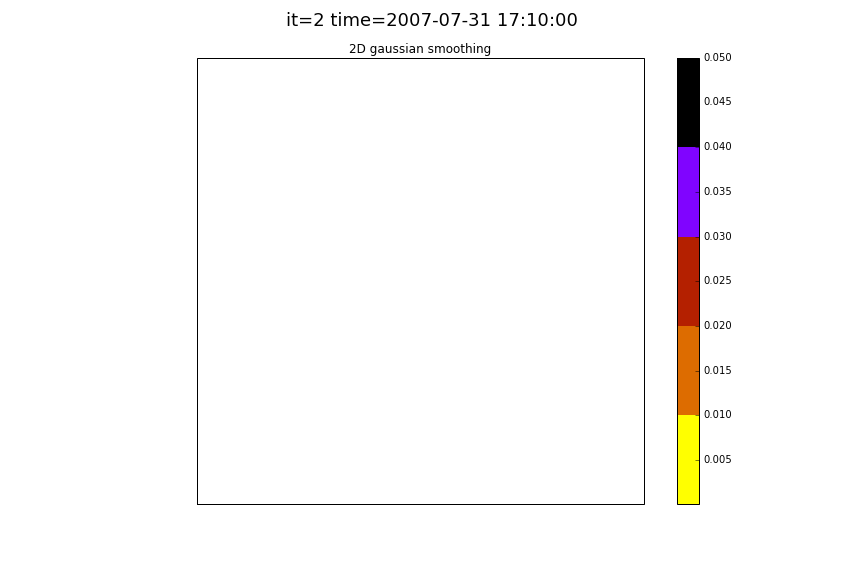
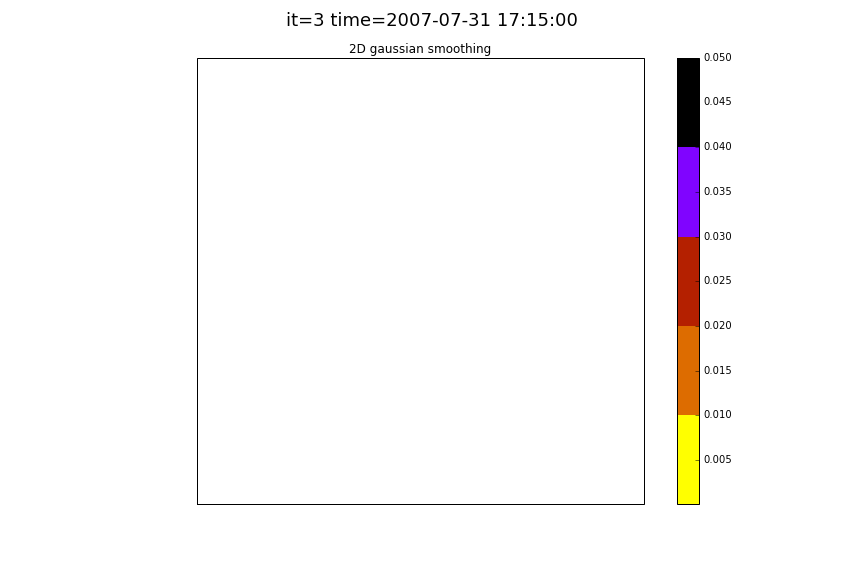
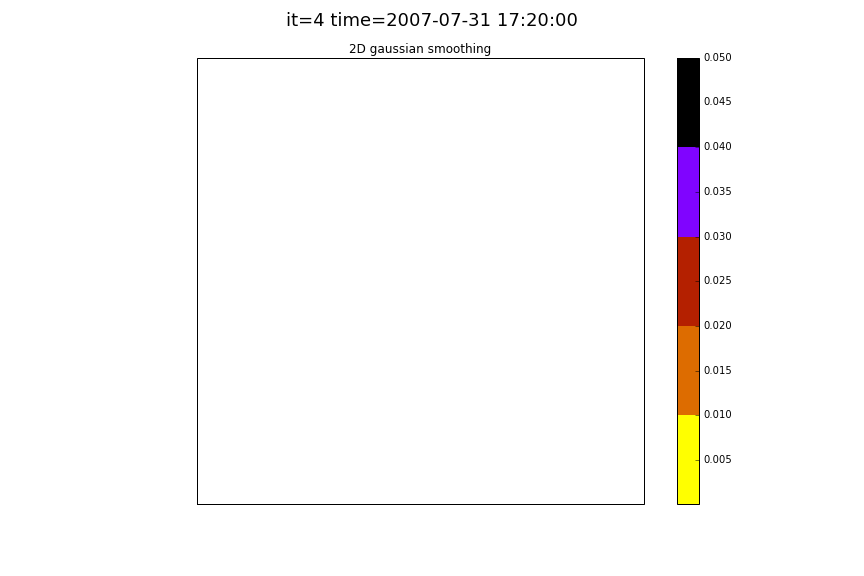
...
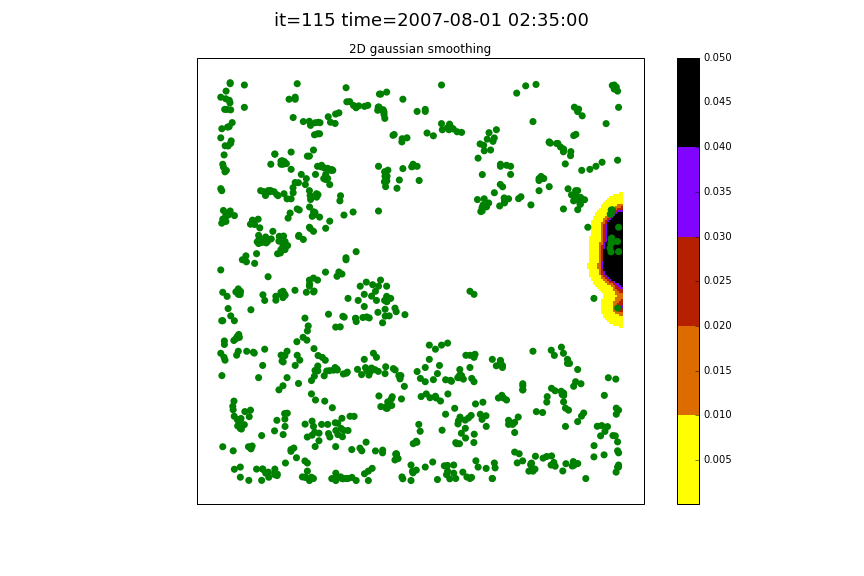
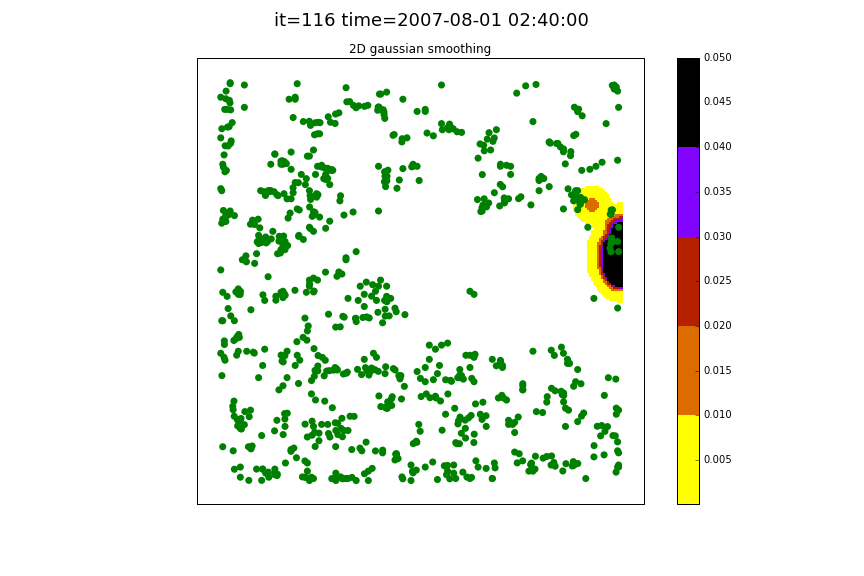
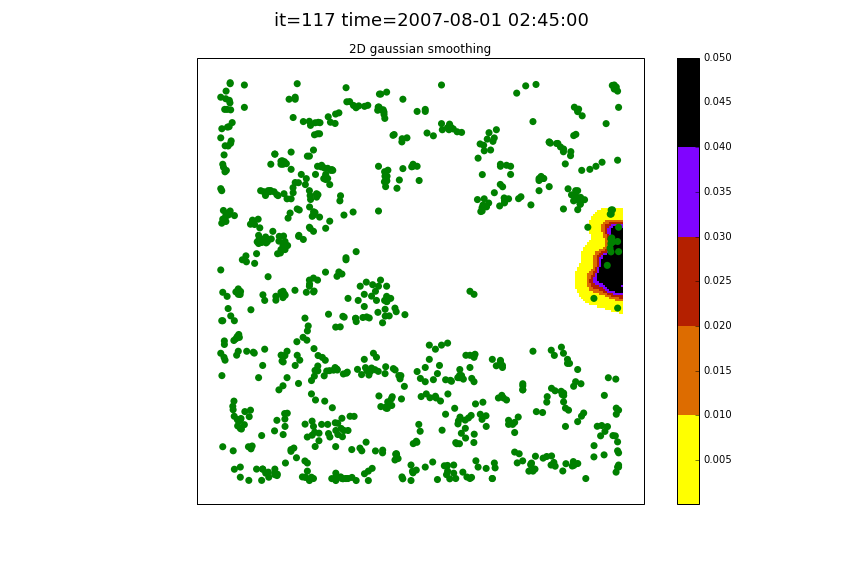
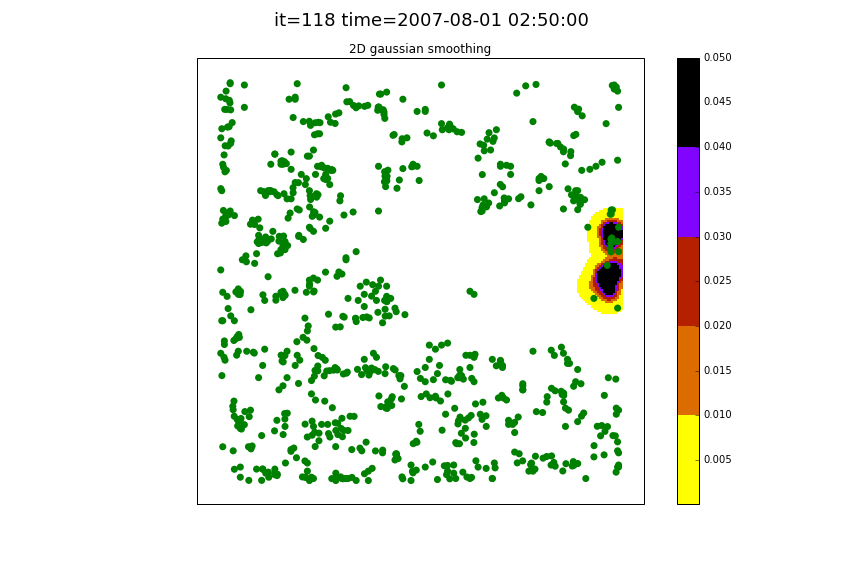
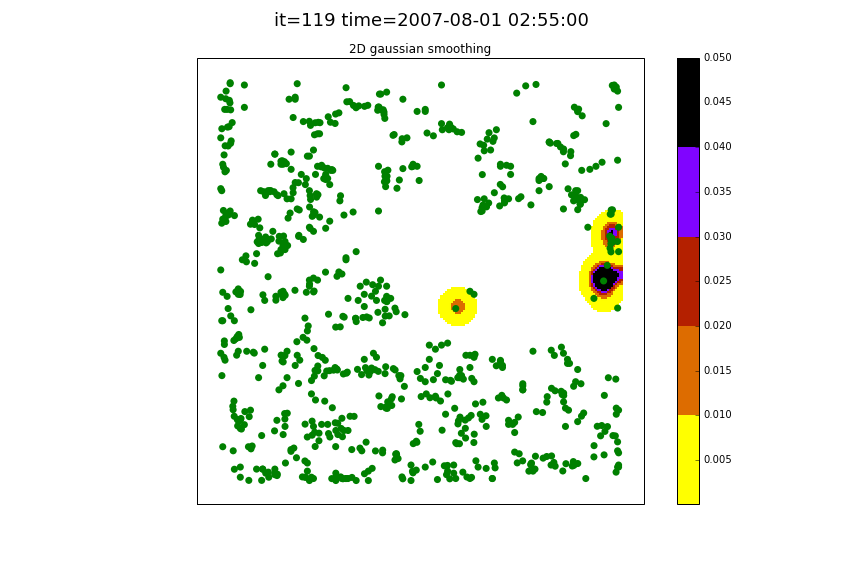

In [91]:
tracks=True

from matplotlib import animation
from JSAnimation import IPython_display

cmap = cmap=plt.get_cmap('gnuplot_r', 5)
cmap.set_under('None')

fig = plt.figure(figsize=(12, 6))

ax2 = background(plt.subplot(1, 1, 1, projection=ccrs.PlateCarree()))
im2, ax2 = c.plot_grid(gauss2d[0], vmin=0.0001, vmax=.05, cmap=cmap, cbar=True, ax=ax2)

ax2.set_title('2D gaussian smoothing')

def init():
    im2.set_data(gauss2d[1])
    return im2, 

def animate(i):
    im2.set_data(gauss2d[i])
    if tracks:
        try:
            ax2.scatter(p[tr[i],:,'centroidX'],p[tr[i],:,'centroidY'], c='green', edgecolors='None', s=50)
        except:
            pass
    fig.suptitle("it={i} time={t}".format(i=i, t=tr[i]), fontsize=18)
    return im2,  

animation.FuncAnimation(fig, animate, init_func=init, blit=False, frames=120, interval=100)

In [92]:
p[:,:,'Bearing'][p[:,:,'Bearing']<0] = p[:,:,'Bearing'][p[:,:,'Bearing']<0] + 360

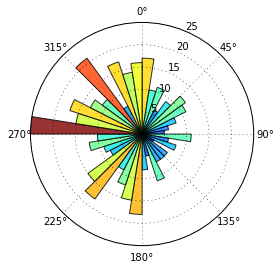

In [111]:
N = 40
bottom = 8
max_height = 4

theta = np.linspace(0.0, 2 *np.pi, N, endpoint=False)
radii, _ = np.histogram(p[:,:,'Bearing'].unstack().dropna().values, bins=N)
width = (2*np.pi) / N

ax = plt.subplot(111, polar=True)
ax.set_theta_zero_location("N")
ax.set_theta_direction(-1)

bars = ax.bar(theta, radii, width=width)


# Use custom colors and opacity
for r, bar in zip(radii, bars):
    bar.set_facecolor(plt.cm.jet(r/float(np.max(radii))))
    bar.set_alpha(0.8)
plt.show()

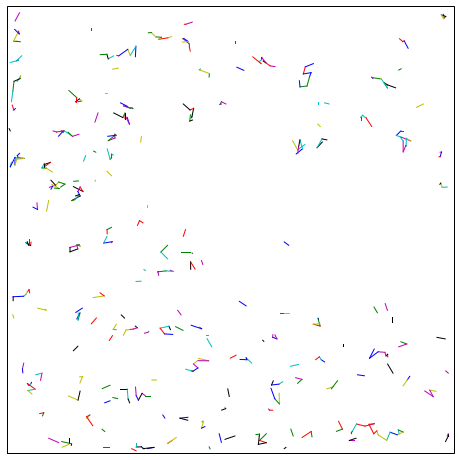

In [89]:
plt.figure(figsize=(8,8))
im, ax = c.plot_grid(box[0], vmin=1, vmax=10)
for i in range(len(lines)-1):
    for ifeat in range(lines[i].shape[0]):
        plt.plot(lines[i].iloc[ifeat,[0,3]].values, lines[i].iloc[ifeat,[1,4]].values);

In [84]:
from rpy2 import robjects 
from rpy2.robjects.packages import importr
from rpy2.robjects import pandas2ri
pandas2ri.activate()
SpatialVx = importr('SpatialVx')
rsummary = robjects.r.summary

def import_r_tools(filename='r-tools.R'):
    import os
    from rpy2.robjects import pandas2ri, r, globalenv
    from rpy2.robjects.packages import STAP
    pandas2ri.activate()
    #path = os.path.dirname(os.path.realpath(__file__))
    path = './'
    with open(os.path.join(path,filename), 'r') as f:
        string = f.read()
    rfuncs = STAP(string, "rfuncs")
    return rfuncs

def dotvars(**kwargs):
    res = {}
    for k, v in kwargs.items():
        res[k.replace('_', '.')] = v
    return res

r_tools = import_r_tools()

In [ ]:
d = {}
X, Y = np.meshgrid(c.gridx[0:-1], c.gridy[0:-1])
ll = np.array([X.flatten('F'), Y.flatten('F')]).T
for i in range(box.shape[0]-1):
    hold = SpatialVx.make_SpatialVx(box[i,:,:], box[i+1,:,:], loc=ll)
    #look = SpatialVx.FeatureFinder(hold, 
    #                               smoothpar=3,  smoothfun ="gauss2dsmooth",  nx=199, ny=199,
    #                               thresh=.01, min_size=20)
    look = r_tools.FeatureFinder_gaussian(hold, smoothpar=3,nx=599, ny=599, thresh=.01, **(dotvars(min_size=4)))
    try:
        x = rsummary(look, silent=True)[0]
    except:
        continue
    px = pandas2ri.ri2py(x)
    df0 = pd.DataFrame(px, columns=['centroidX', 'centroidY', 'area', 'OrientationAngle', 
                                  'AspectRatio', 'Intensity0.25', 'Intensity0.9'])
    df0['Observed'] = list(df0.index+1)
    m = SpatialVx.centmatch(look, criteria=3, const=5)
    #m = SpatialVx.deltamm(look, p=1)
    p = pandas2ri.ri2py(m[12])
    df1 = pd.DataFrame(p, columns=['Forecast', 'Observed'])
    l = SpatialVx.FeatureMatchAnalyzer(m)
    try:
        p = pandas2ri.ri2py(rsummary(l, silent=True))
    except:
        continue
    df2 = pd.DataFrame(p, columns=['Partial Hausdorff Distance','Mean Error Distance','Mean Square Error Distance',
                                  'Pratts Figure of Merit','Minimum Separation Distance', 'Centroid Distance',
                                  'Angle Difference','Area Ratio','Intersection Area','Bearing', 'Baddeleys Delta Metric',
                                  'Hausdorff Distance'])
    df3 = df1.join(df2)
    print tr[i]
    d.update({tr[i]: pd.merge(df0, df3, how='outer')})

2007-07-31 17:00:00
[1] "No matches found"
2007-07-31 17:10:00
2007-07-31 17:15:00
2007-07-31 17:20:00
2007-07-31 17:25:00
2007-07-31 17:30:00
2007-07-31 17:35:00
2007-07-31 17:40:00
2007-07-31 17:45:00
2007-07-31 17:50:00
2007-07-31 17:55:00
2007-07-31 18:00:00
2007-07-31 18:05:00
2007-07-31 18:10:00
2007-07-31 18:15:00


In [86]:
p =pd.Panel(d)
p

<class 'pandas.core.panel.Panel'>
Dimensions: 114 (items) x 20 (major_axis) x 21 (minor_axis)
Items axis: 2007-07-31 18:00:00 to 2007-08-01 04:10:00
Major_axis axis: 0 to 19
Minor_axis axis: centroidX to Hausdorff Distance

In [87]:
computed = pd.HDFStore('computed.h5')
computed['features_buffer0_1km5min_thresh01_sigma3_minarea4_const5_2007_07_31_full_area'] = p
computed.close()

In [88]:
lines = []
for it in range(p.shape[0]-1):
    try:
        df0 = p[tr[it],:,['centroidX', 'centroidY', 'Forecast']].dropna()
        df1 = p[tr[it+1],:,['centroidX', 'centroidY', 'Observed']].dropna()
    except:
        continue
    df0.index = df0['Forecast']
    df1.index = df1['Observed']
    df = df0.join(df1, lsuffix='_start', rsuffix='_end').dropna(how='any')
    lines.append(df)